# Feature engineering

Convert categorical variable, scaling and identify feature importance

In [ ]:
pip install category_encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 2.2 MB/s eta 0:00:00


In [ ]:
# Laod libraries

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from category_encoders.ordinal import OrdinalEncoder
from sklearn.metrics import mean_squared_error,r2_score

sns.set_context("talk")

In [ ]:
# Load data

from google.colab import files
uploaded = files.upload()

Saving eng_workforce_master_updated.csv to eng_workforce_master_updated.csv


In [ ]:
# load data and remove unneccessary columns. Set date as the index

nurse_df = pd.read_csv('eng_workforce_master_updated.csv')

nurse_tidy = nurse_df.drop(["org_name", "nhse_region_name", "ics_name", "hc_lag1",
                            "hc_leavers_lag2", "hc_leavers_lag3", "hc_leavers_lag4",
                            "hc_joiners_lag2", "hc_joiners_lag3", "hc_joiners_lag4",
                             "MHS32_lag2","MHS32_lag3",
                             "MHS01_lag2", "MHS01_lag3",
                             "MHS07_lag2", "MHS07_lag3",
                             "MHS29_lag2", "MHS29_lag3",

                             "MHS32_low_lag2","MHS32_low_lag3",
                             "MHS01_low_lag2", "MHS01_low_lag3",
                             "MHS07_low_lag2", "MHS07_low_lag3",
                             "MHS29_low_lag2", "MHS29_low_lag3",

                             "MHS32_high_lag2","MHS32_high_lag3",
                             "MHS01_high_lag2", "MHS01_high_lag3",
                             "MHS07_high_lag2", "MHS07_high_lag3",
                             "MHS29_high_lag2", "MHS29_high_lag3",

                             "ucas_acceptance_lag1", "ucas_acceptance_lag2", "ucas_acceptance_lag3"], axis = 1)

nurse_tidy['date'] = nurse_tidy['date'].apply(pd.to_datetime)

In [ ]:
# convert datetime to end-of-month

nurse_tidy = nurse_tidy.set_index("date")

nurse_tidy.index = nurse_tidy.index.to_period('M').to_timestamp('M')

nurse_tidy = nurse_tidy.reset_index()

nurse_tidy

,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,MHS01_high_lag1,MHS01_low_lag1,MHS07_high,MHS07_low,MHS07_high_lag1,MHS07_low_lag1,MHS29_high,MHS29_low,MHS29_high_lag1,MHS29_low_lag1
0,2018-07-31,2018,7,R1L,Y61,QH8,1483,19.000000,8.000000,0.000000,...,28145.000000,28145.000000,550.000000,550.000000,555.000000,555.000000,35670.000000,35670.000000,34880.000000,34880.000000
1,2018-07-31,2018,7,RAT,Y56,QMF,1832,18.000000,23.000000,0.000000,...,36180.000000,36180.000000,220.000000,220.000000,230.000000,230.000000,59050.000000,59050.000000,57740.000000,57740.000000
2,2018-07-31,2018,7,RDY,Y58,QVV,1698,17.000000,6.000000,0.000000,...,15440.000000,15440.000000,340.000000,340.000000,340.000000,340.000000,27705.000000,27705.000000,27695.000000,27695.000000
3,2018-07-31,2018,7,RGD,Y63,QWO,715,6.000000,9.000000,0.000000,...,15685.000000,15685.000000,355.000000,355.000000,350.000000,350.000000,29535.000000,29535.000000,27495.000000,27495.000000
4,2018-07-31,2018,7,RHA,Y60,QT1,2570,23.000000,11.000000,0.000000,...,21815.000000,21815.000000,860.000000,860.000000,865.000000,865.000000,35495.000000,35495.000000,35555.000000,35555.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5665,2028-12-31,2028,12,RXV,Y62,QOP,0,29.307739,43.611277,28.574231,...,37923.886706,32121.390814,1151.996371,1087.330566,1164.235568,1099.569764,120051.302007,110119.792175,130461.547552,120530.037720
5666,2028-12-31,2028,12,RXX,Y59,QXU,0,9.313750,10.168205,9.456801,...,34174.789603,29297.406662,129.005088,114.794208,124.852368,110.641488,28547.500624,17582.998727,32167.989256,21203.487358
5667,2028-12-31,2028,12,RXY,Y59,QKS,0,15.205238,13.136847,14.741527,...,21682.435503,20364.938612,411.637469,371.318519,398.392990,358.074039,51545.751942,45978.841931,63330.724101,57763.814089
5668,2028-12-31,2028,12,RYG,Y60,QWU,0,18.569753,22.707835,20.186316,...,10419.200610,-5911.030861,129.859703,-1.379077,127.999042,-3.239738,23598.278508,18528.752604,27535.088735,22465.562830


In [ ]:
# convert categorical features - for ML models

# Set up the ordinal encoder

o_enc = OrdinalEncoder()

o_enc.fit(nurse_tidy)

OrdinalEncoder(cols=['org_code', 'nhse_region_code', 'ics_code'],
               mapping=[{'col': 'org_code', 'data_type': dtype('O'),
                         'mapping': R1L     1
RAT     2
RDY     3
RGD     4
RHA     5
RJ8     6
RKL     7
RLY     8
RMY     9
RNK    10
RNU    11
RP1    12
RP7    13
RPG    14
RQY    15
RRE    16
RRP    17
RT1    18
RT2    19
RT5    20
RTQ    21
RV3    22
RV5    23
RV9    24
RVN    25
RW1    26
RW4    27
RW5    28
RWK    29
RWR    30
RWV    31
RWX    32
RX2    33
RX3    34
RX4    35
RXA    36
RXE    37
RXG    38
RXM    39
RXT    40
RXV    41
RXX    42
RXY    43
RYG    44
TAJ    45
NaN    -2
dtype:...64},
                        {'col': 'nhse_region_code', 'data_type': dtype('O'),
                         'mapping': Y61    1
Y56    2
Y58    3
Y63    4
Y60    5
Y59    6
Y62    7
NaN   -2
dtype: int64},
                        {'col': 'ics_code', 'data_type': dtype('O'),
                         'mapping': QH8     1
QMF     2
QVV     3
QWO     4
QT1     5
QT6     6
QRV     7
QNC     8
QMM     9
QMJ    10
QU9    11
QPM    12
QJM    13
QKK    14
QWE    15
QUE    16
QOP    17
QK1    18
QR1    19
QOQ    20
QOX    21
QRL    22
QYG    23
QE1    24
QM7    25
QJK    26
QNQ    27
QNX    28
QHM    29
QF7    30
QJ2    31
QHL    32
QXU    33
QKS    34
QWU    35
QUA    36
NaN    -2
dtype: int64}])

In [ ]:
# Category encoders's finds categorical variables

o_enc.cols

['org_code', 'nhse_region_code', 'ics_code']

In [ ]:
# Category encoders's encoder replaces the categories
# with integers, in place, returning a dataframe with the original
# and encoded variables, by default.

nurse_tidy_t = o_enc.transform(nurse_tidy)

nurse_tidy_t.head()

,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,MHS01_high_lag1,MHS01_low_lag1,MHS07_high,MHS07_low,MHS07_high_lag1,MHS07_low_lag1,MHS29_high,MHS29_low,MHS29_high_lag1,MHS29_low_lag1
0,2018-07-31,2018,7,1,1,1,1483,19.0,8.0,0.0,...,28145.0,28145.0,550.0,550.0,555.0,555.0,35670.0,35670.0,34880.0,34880.0
1,2018-07-31,2018,7,2,2,2,1832,18.0,23.0,0.0,...,36180.0,36180.0,220.0,220.0,230.0,230.0,59050.0,59050.0,57740.0,57740.0
2,2018-07-31,2018,7,3,3,3,1698,17.0,6.0,0.0,...,15440.0,15440.0,340.0,340.0,340.0,340.0,27705.0,27705.0,27695.0,27695.0
3,2018-07-31,2018,7,4,4,4,715,6.0,9.0,0.0,...,15685.0,15685.0,355.0,355.0,350.0,350.0,29535.0,29535.0,27495.0,27495.0
4,2018-07-31,2018,7,5,5,5,2570,23.0,11.0,0.0,...,21815.0,21815.0,860.0,860.0,865.0,865.0,35495.0,35495.0,35555.0,35555.0


In [ ]:
# Scaling data

nurse_scale = nurse_tidy_t.drop(nurse_tidy_t.iloc[:, 44:61],axis = 1)

nurse_scale

,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,age_45_49,age_50_54,age_55_59,age_60_64,SFTN,IFTN,ucas_acceptance_rate,ucas_acceptance_lag4,international_joiners_mental_health,time_window
0,2018-07-31,2018,7,1,1,1,1483,19.000000,8.000000,0.000000,...,4227170,4360366,3976862,3391759,14.90,500.750000,-12.500000,21.670000,13,0
1,2018-07-31,2018,7,2,2,2,1832,18.000000,23.000000,0.000000,...,596141,564205,479470,378068,14.90,500.750000,4.170000,0.000000,13,0
2,2018-07-31,2018,7,3,3,3,1698,17.000000,6.000000,0.000000,...,373652,402594,379723,338670,14.90,500.750000,15.790000,14.290000,13,0
3,2018-07-31,2018,7,4,4,4,715,6.000000,9.000000,0.000000,...,542641,571347,541354,473053,14.90,500.750000,17.320000,-6.000000,13,0
4,2018-07-31,2018,7,5,5,5,2570,23.000000,11.000000,0.000000,...,725636,752739,688304,590748,14.90,500.750000,0.000000,10.320000,13,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5665,2028-12-31,2028,12,41,7,17,0,29.307739,43.611277,28.574231,...,460236,416288,487126,498320,17.15,1037.247826,32.771861,32.797082,44,125
5666,2028-12-31,2028,12,42,6,33,0,9.313750,10.168205,9.456801,...,624565,583068,629188,635383,17.15,1037.247826,37.748016,37.748016,44,125
5667,2028-12-31,2028,12,43,6,34,0,15.205238,13.136847,14.741527,...,624565,583068,629188,635383,17.15,1037.247826,37.748016,37.748016,44,125
5668,2028-12-31,2028,12,44,5,35,0,18.569753,22.707835,20.186316,...,687276,629911,728994,740441,17.15,1037.247826,59.813089,59.813089,44,125


In [ ]:
## #Train and Test data set

# I use 2018 Jun - 2022 Dec as the training set

train = nurse_scale[nurse_scale['year'] <= 2022]

val = nurse_scale[nurse_scale['year'] > 2022]

pred = val

In [ ]:
## drop forecasting variable

X_train = train.drop(['hc', 'date'], axis = 1)
y_train = train['hc']

features = X_train.columns

X_test = val.drop(['hc', 'date'], axis = 1)
y_test = val["hc"]

In [ ]:
# Create the data matrix and target variable
# We standardise the features and target so
# we can use LASSO for feature selection

y = y_train

X = StandardScaler().fit_transform(X_train)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.246e+07, tolerance: 1.027e+05
  model = cd_fast.enet_coordinate_descent(


<Axes: >

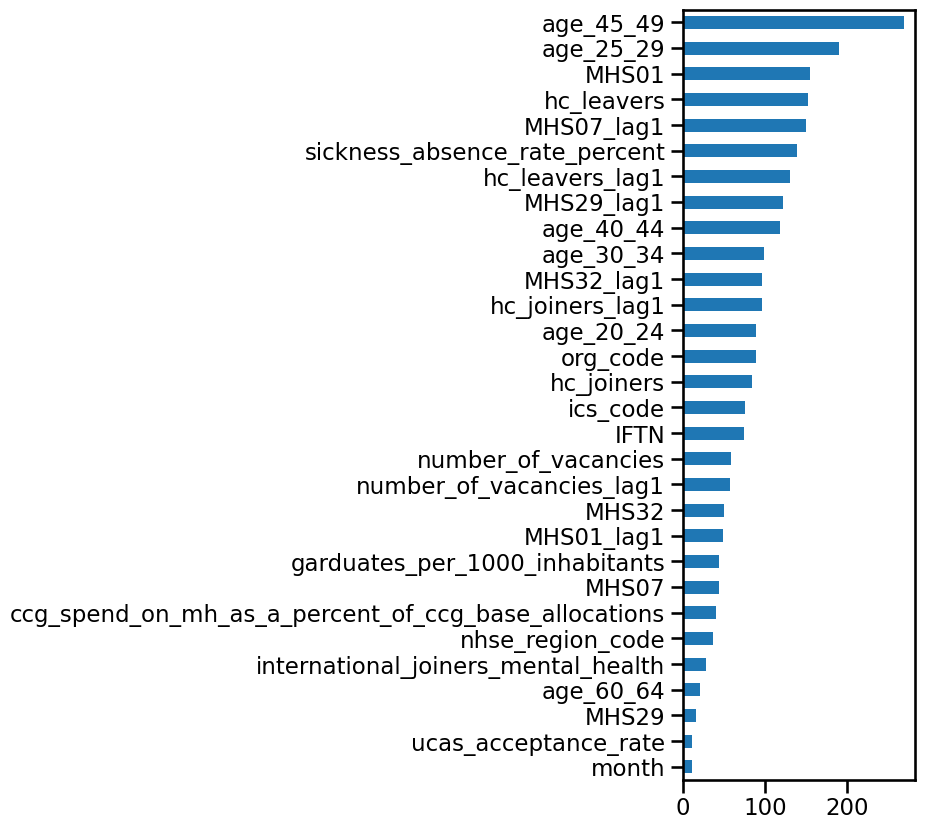

In [ ]:
# Now let's use LASSO

model = Lasso(alpha = 0.1)

model.fit(X, y)

feat_importances = pd.Series(index=features, data=model.coef_)

feat_importances.abs().nlargest(30).iloc[::-1].plot(kind="barh", figsize=(3, 10))

In [ ]:
print('R squared training set', round(model.score(X, y)*100, 2))
print('R squared test set', round(reg.score(X_test, y_test)*100, 2))

R squared training set 62.77


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.806e+08, tolerance: 1.027e+05
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.704e+08, tolerance: 1.027e+05
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.603e+08, tolerance: 1.027e

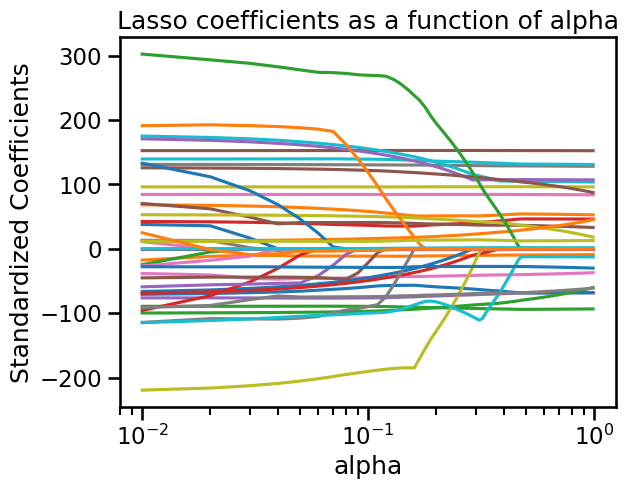

In [ ]:
## coefficients in Lasso regression may vary according to the determined alpha parameter

# Coefficients for different lambda values.

alphas = [x / 100.0 for x in range(1, 100, 1)]
lasso = Lasso(max_iter=1000)
coefs = []

for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X, y)
    coefs.append(lasso.coef_)

ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('Standardized Coefficients')
plt.title('Lasso coefficients as a function of alpha');

In [ ]:
## cross validation to get the best alpha

from sklearn.linear_model import LassoCV

# Lasso with 5 fold cross-validation
model = LassoCV(cv=5, random_state=0, max_iter=1000)

# Fit model
model.fit(X, y)

LassoCV(cv=5, max_iter=1000, random_state=0)

model.alpha_

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138494.62371379137, tolerance: 82236.30296250003
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 531118.826367259, tolerance: 82236.30296250003
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1073250.4074855447, tolerance: 82236.30296250003
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWa

33.456857543401505

In [ ]:
## Best lasso model

lasso_best = Lasso(alpha=model.alpha_)

lasso_best.fit(X, y)

Lasso(alpha=33.456857543401505)

<Axes: >

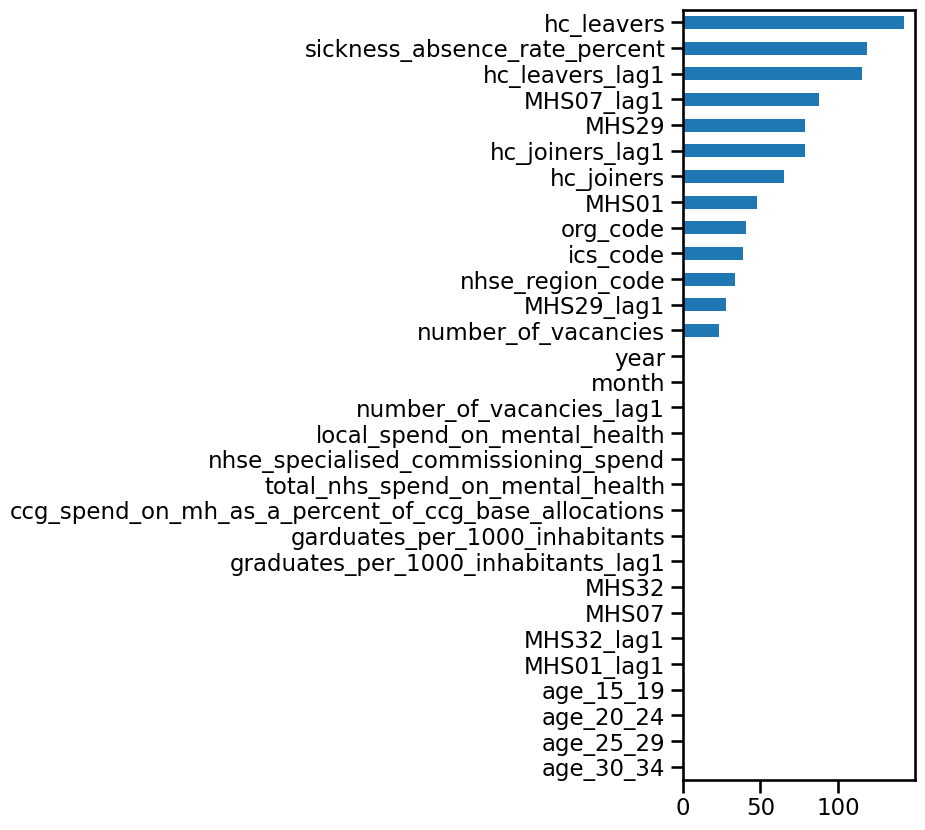

In [ ]:
## Feature importance

feat_importances = pd.Series(index=features, data=lasso_best.coef_)

feat_importances.abs().nlargest(30).iloc[::-1].plot(kind="barh", figsize=(3, 10))

In [ ]:
## Model evaluation

print('R squared training set', round(lasso_best.score(X, y)*100, 2))

R squared training set 59.04


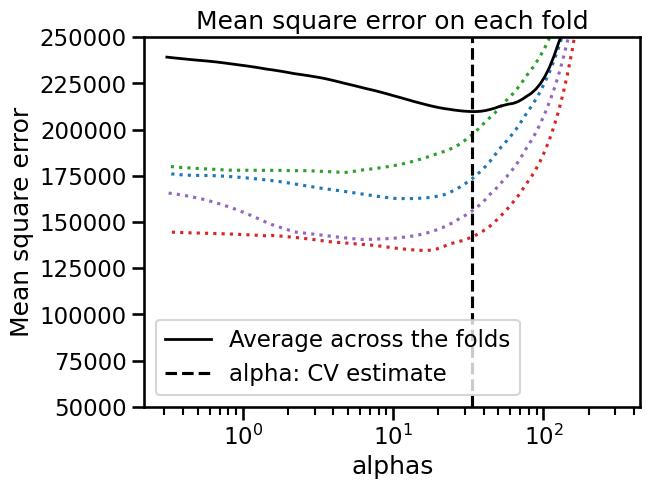

In [ ]:
plt.semilogx(model.alphas_, model.mse_path_, ":")
plt.plot(
    model.alphas_ ,
    model.mse_path_.mean(axis=-1),
    "k",
    label="Average across the folds",
    linewidth=2,
)
plt.axvline(
    model.alpha_, linestyle="--", color="k", label="alpha: CV estimate"
)

plt.legend()
plt.xlabel("alphas")
plt.ylabel("Mean square error")
plt.title("Mean square error on each fold")
plt.axis("tight")

ymin, ymax = 50000, 250000
plt.ylim(ymin, ymax);

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.246e+07, tolerance: 1.027e+05
  model = cd_fast.enet_coordinate_descent(


<Axes: >

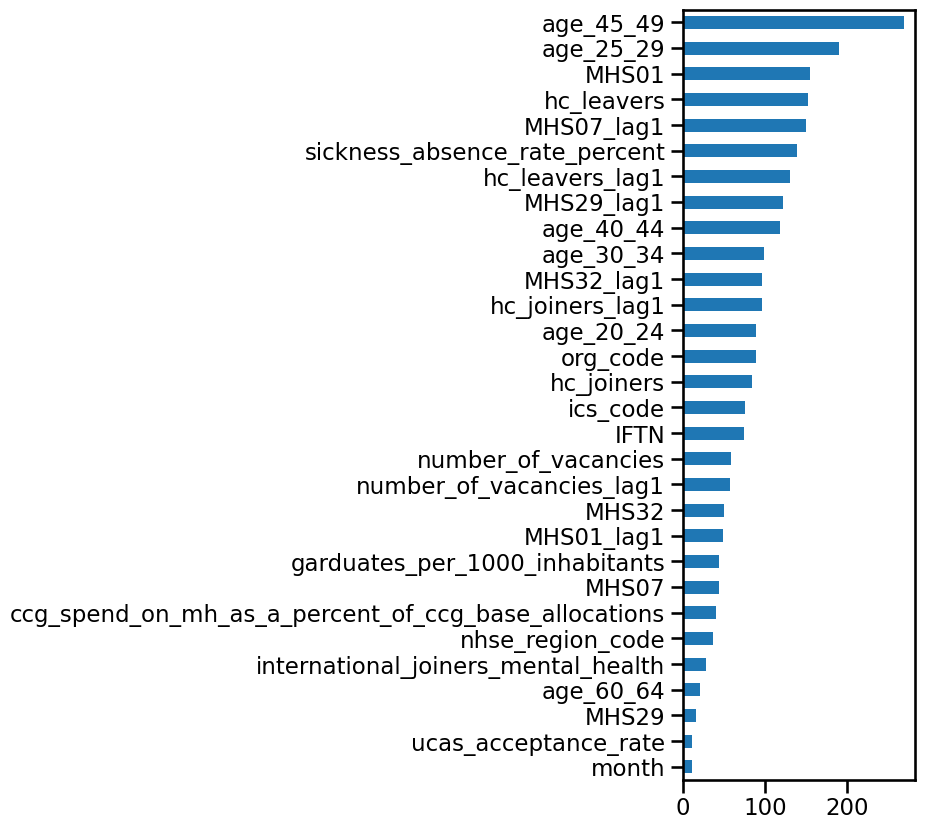

In [ ]:
## We will use alpha = 0.1 as it has the highest r squared

model = Lasso(alpha = 0.1)

model.fit(X, y)

feat_importances = pd.Series(index=features, data=model.coef_)

feat_importances.abs().nlargest(30).iloc[::-1].plot(kind="barh", figsize=(3, 10))

In [ ]:
top_features = pd.DataFrame(feat_importances.abs().nlargest(30)).reset_index()

In [ ]:
## Save results

top_features.to_csv("lasso_features_eng.csv", index=False)
files.download("lasso_features_eng.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
top_features_list = top_features['index'].tolist()

# Build forecast models using Nixtla

## Univariate models

In [ ]:
!pip install statsforecast mlforecast neuralforecast s3fs pyarrow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.9/110.9 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.9/161.9 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.0/275.0 kB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 725.0/725.0 kB 38.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 MB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 95.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.2/169.2 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.6/154.6 kB 18.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.9/295.9 kB 30.7 MB/s et

In [ ]:
# Load libraries

from statsforecast import StatsForecast

/usr/local/lib/python3.10/dist-packages/statsforecast/core.py:25: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [ ]:
# Rename columns to match the Nixtlaverse's expectations
# The 'org_code' becomes 'unique_id' representing the unique identifier of the time series
# The 'date' becomes 'ds' representing the time stamp of the data points
# The 'hc' becomes 'y' representing the target variable we want to forecast

nurse_df = nurse_tidy[nurse_tidy['year'] <= 2022]

nurse_df = nurse_df[['date','org_code', 'hc']].copy()

nurse_df = nurse_df.rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})

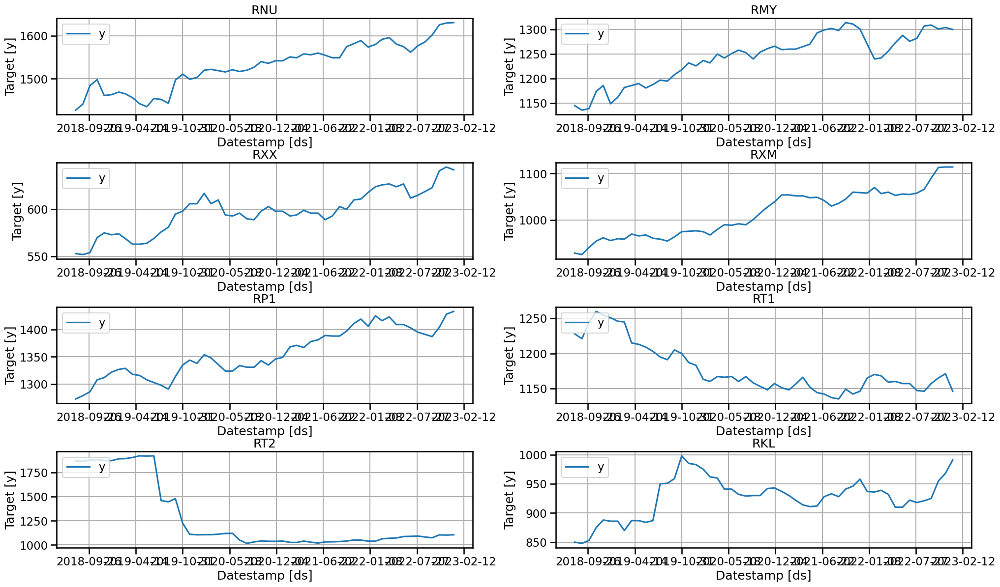

In [ ]:
# Feature: plot random series for EDA

StatsForecast.plot(nurse_df)

In [ ]:
# Import necessary models from the statsforecast library
from statsforecast.models import (
    SeasonalNaive,
    AutoARIMA,
    AutoETS
)

In [ ]:
# Fit models

horizon = 72

snaive = [
    SeasonalNaive(season_length=12)
]

arima = [
    AutoARIMA(season_length = 12)
]

ets = [
    AutoETS(season_length=12)
]



In [ ]:
# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

In [ ]:
# Instantiate the StatsForecast class

fit_snaive = StatsForecast(
    models=snaive,  # A list of models to be used for forecasting
    freq='M',  # The frequency of the time series data (in this case, 'D' stands for daily frequency)
    n_jobs=-1,  # The number of CPU cores to use for parallel execution (-1 means use all available cores)
)


fit_arima = StatsForecast(
    models=arima,  # A list of models to be used for forecasting
    freq='M',  # The frequency of the time series data (in this case, 'D' stands for daily frequency)
    n_jobs=-1,  # The number of CPU cores to use for parallel execution (-1 means use all available cores)
)


fit_ets = StatsForecast(
    models=ets,  # A list of models to be used for forecasting
    freq='M',  # The frequency of the time series data (in this case, 'D' stands for daily frequency)
    n_jobs=-1,  # The number of CPU cores to use for parallel execution (-1 means use all available cores)
)


In [ ]:
from time import time

# Get the current time before forecasting starts, this will be used to measure the execution time
init = time()

# Call the forecast method of the StatsForecast instance to predict the next 72 months (h=72)

# Level is set to [0.01 - 99.99], which means that it will compute the 0.01 - 90.99% prediction intervals

pred_snaive = fit_snaive.forecast(df = nurse_df, h=72, level=levels)

pred_arima = fit_arima.forecast(df = nurse_df, h=72, level=levels)

pred_ets = fit_ets.forecast(df = nurse_df, h=72, level=levels)


# Get the current time after the forecasting ends
end = time()

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/statsforecast/core.py:1103: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcsts_df[cols] = fcsts
/usr/local/lib/python3.10/dist-packages/statsforecast/core.py:1103: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcsts_df[cols] = fcsts
/usr/local/lib/python3.10/dist-packages/statsforecast/core.py:1103: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performa

In [ ]:
# Calculate and print the total time taken for the forecasting in minutes
print(f'Forecast Minutes: {(end - init) / 60}')

Forecast Minutes: 2.4892914573351543


In [ ]:
pred_snaive

,ds,SeasonalNaive,SeasonalNaive-lo-0.1,SeasonalNaive-lo-0.2,SeasonalNaive-lo-0.3,SeasonalNaive-lo-0.4,SeasonalNaive-lo-0.5,SeasonalNaive-lo-0.6,SeasonalNaive-lo-0.7,SeasonalNaive-lo-0.8,...,SeasonalNaive-hi-99.0,SeasonalNaive-hi-99.1,SeasonalNaive-hi-99.2,SeasonalNaive-hi-99.3,SeasonalNaive-hi-99.4,SeasonalNaive-hi-99.5,SeasonalNaive-hi-99.6,SeasonalNaive-hi-99.7,SeasonalNaive-hi-99.8,SeasonalNaive-hi-99.9
unique_id,,,,,,,,,,,,,,,,,,,,,
R1L,2023-01-31,1643.0,1642.772949,1642.545898,1642.318848,1642.091797,1641.864746,1641.637695,1641.410645,1641.183594,...,2109.638672,2116.201172,2123.450439,2131.561768,2140.789551,2151.523682,2164.409424,2180.636963,2202.828125,2239.113525
R1L,2023-02-28,1643.0,1642.772949,1642.545898,1642.318848,1642.091797,1641.864746,1641.637695,1641.410645,1641.183594,...,2109.638672,2116.201172,2123.450439,2131.561768,2140.789551,2151.523682,2164.409424,2180.636963,2202.828125,2239.113525
R1L,2023-03-31,1649.0,1648.772949,1648.545898,1648.318848,1648.091797,1647.864746,1647.637695,1647.410645,1647.183594,...,2115.638672,2122.201172,2129.450439,2137.561768,2146.789551,2157.523682,2170.409424,2186.636963,2208.828125,2245.113525
R1L,2023-04-30,1636.0,1635.772949,1635.545898,1635.318848,1635.091797,1634.864746,1634.637695,1634.410645,1634.183594,...,2102.638672,2109.201172,2116.450439,2124.561768,2133.789551,2144.523682,2157.409424,2173.636963,2195.828125,2232.113525
R1L,2023-05-31,1637.0,1636.772949,1636.545898,1636.318848,1636.091797,1635.864746,1635.637695,1635.410645,1635.183594,...,2103.638672,2110.201172,2117.450439,2125.561768,2134.789551,2145.523682,2158.409424,2174.636963,2196.828125,2233.113525
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TAJ,2028-08-31,1063.0,1062.940186,1062.880493,1062.820679,1062.760986,1062.701172,1062.641357,1062.581665,1062.521851,...,1185.828369,1187.555786,1189.463867,1191.598999,1194.027954,1196.853394,1200.245117,1204.516479,1210.357666,1219.908691
TAJ,2028-09-30,1063.0,1062.940186,1062.880493,1062.820679,1062.760986,1062.701172,1062.641357,1062.581665,1062.521851,...,1185.828369,1187.555786,1189.463867,1191.598999,1194.027954,1196.853394,1200.245117,1204.516479,1210.357666,1219.908691
TAJ,2028-10-31,1072.0,1071.940186,1071.880493,1071.820679,1071.760986,1071.701172,1071.641357,1071.581665,1071.521851,...,1194.828369,1196.555786,1198.463867,1200.598999,1203.027954,1205.853394,1209.245117,1213.516479,1219.357666,1228.908691


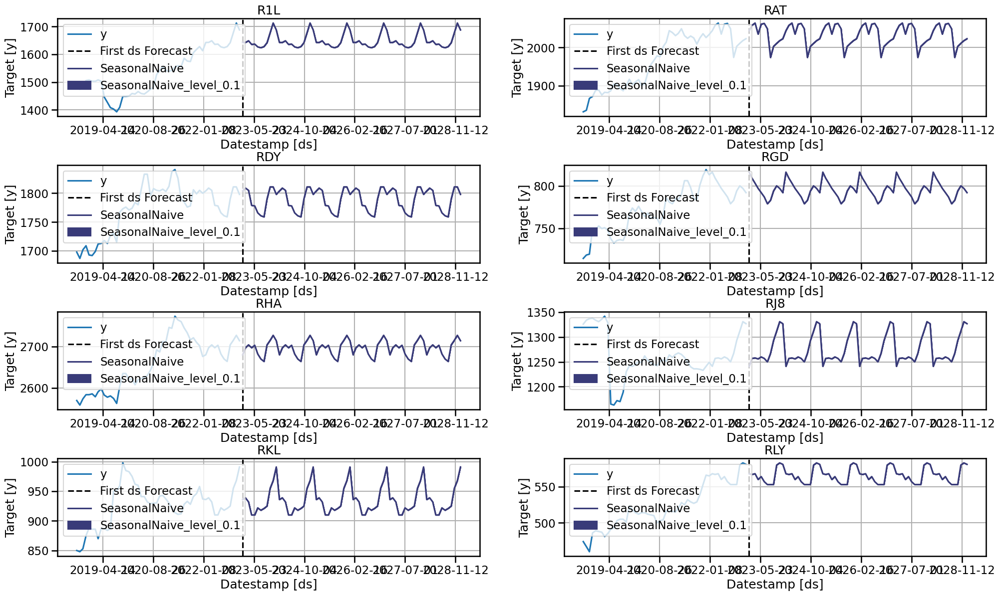

In [ ]:
#Plot prediction intervals

##SeasonalNaive

fit_snaive.plot(nurse_df, pred_snaive, plot_random = False)

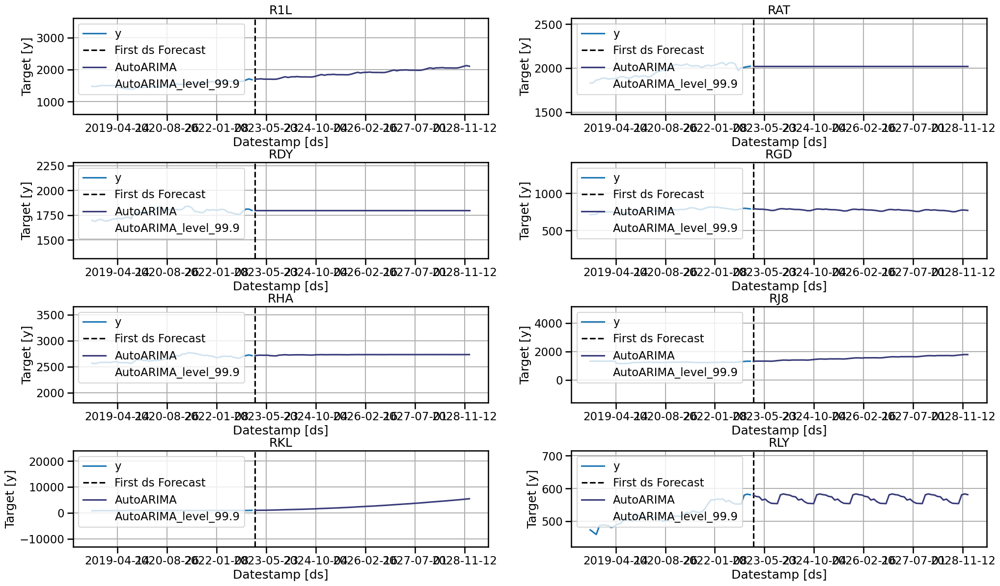

In [ ]:
##ARIMA

fit_arima.plot(nurse_df, pred_arima, plot_random = False)

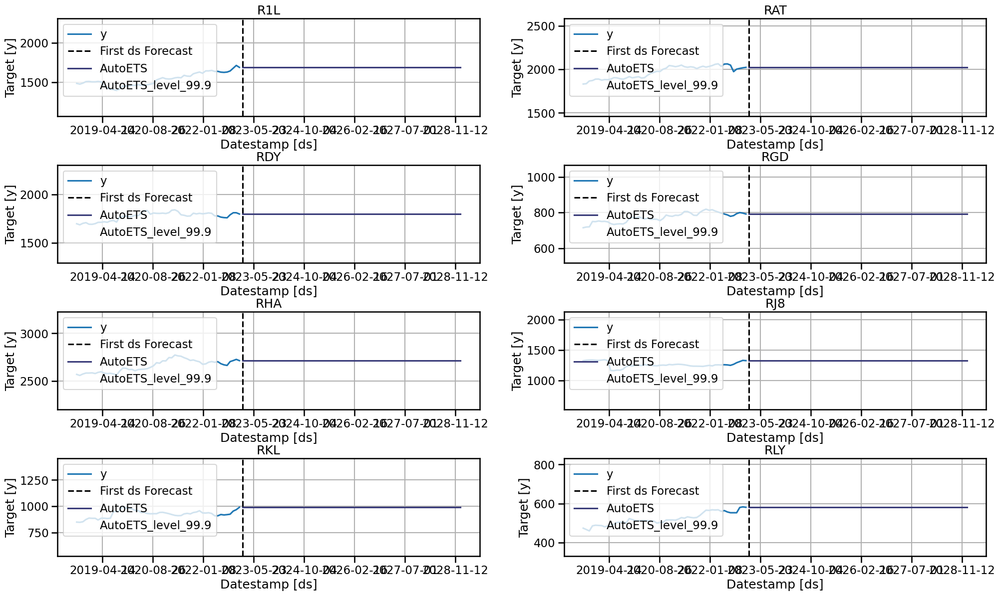

In [ ]:
##ets

fit_ets.plot(nurse_df, pred_ets, plot_random = False)

In [ ]:
## Save results

pred_snaive.to_csv("pred_snaive_eng.csv", index=False)
files.download("pred_snaive_eng.csv")

pred_arima.to_csv("pred_arima_eng.csv", index=False)
files.download("pred_arima_eng.csv")

pred_ets.to_csv("pred_ets_eng.csv", index=False)
files.download("pred_ets_eng.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## ML models

In [ ]:
## Load libraries

from mlforecast import MLForecast
from mlforecast.target_transforms import Differences
from mlforecast.utils import PredictionIntervals
from window_ops.expanding import expanding_mean
from window_ops.rolling import rolling_mean

from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression


Normal scenario

In [ ]:

nurse_base = nurse_tidy.drop(nurse_tidy_t.iloc[:, 44:61],axis = 1)
nurse_base

,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,age_45_49,age_50_54,age_55_59,age_60_64,SFTN,IFTN,ucas_acceptance_rate,ucas_acceptance_lag4,international_joiners_mental_health,time_window
0,2018-07-31,2018,7,R1L,Y61,QH8,1483,19.000000,8.000000,0.000000,...,4227170,4360366,3976862,3391759,14.90,500.750000,-12.500000,21.670000,13,0
1,2018-07-31,2018,7,RAT,Y56,QMF,1832,18.000000,23.000000,0.000000,...,596141,564205,479470,378068,14.90,500.750000,4.170000,0.000000,13,0
2,2018-07-31,2018,7,RDY,Y58,QVV,1698,17.000000,6.000000,0.000000,...,373652,402594,379723,338670,14.90,500.750000,15.790000,14.290000,13,0
3,2018-07-31,2018,7,RGD,Y63,QWO,715,6.000000,9.000000,0.000000,...,542641,571347,541354,473053,14.90,500.750000,17.320000,-6.000000,13,0
4,2018-07-31,2018,7,RHA,Y60,QT1,2570,23.000000,11.000000,0.000000,...,725636,752739,688304,590748,14.90,500.750000,0.000000,10.320000,13,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5665,2028-12-31,2028,12,RXV,Y62,QOP,0,29.307739,43.611277,28.574231,...,460236,416288,487126,498320,17.15,1037.247826,32.771861,32.797082,44,125
5666,2028-12-31,2028,12,RXX,Y59,QXU,0,9.313750,10.168205,9.456801,...,624565,583068,629188,635383,17.15,1037.247826,37.748016,37.748016,44,125
5667,2028-12-31,2028,12,RXY,Y59,QKS,0,15.205238,13.136847,14.741527,...,624565,583068,629188,635383,17.15,1037.247826,37.748016,37.748016,44,125
5668,2028-12-31,2028,12,RYG,Y60,QWU,0,18.569753,22.707835,20.186316,...,687276,629911,728994,740441,17.15,1037.247826,59.813089,59.813089,44,125


In [ ]:
nurse_base['static_id'] = nurse_base['org_code']  # to use the id as a static feature as well

In [ ]:
# Category encoders's encoder replaces the categories
# with integers, in place, returning a dataframe with the original
# and encoded variables, by default.

# convert categorical features - for ML models

# Set up the ordinal encoder

o_enc = OrdinalEncoder()

o_enc.fit(nurse_base[['nhse_region_code', 'ics_code', 'static_id']])

nurse_base[['nhse_region_code', 'ics_code', 'static_id']] = o_enc.transform(nurse_base[['nhse_region_code', 'ics_code', 'static_id']])

In [ ]:
## train is the historic data, test is the future values of predictors

train = nurse_base[nurse_base['year'] <= 2022]

test = nurse_base[nurse_base['year'] > 2022]

In [ ]:
### Update top features list

key_features = ['date','hc', 'static_id']

top_features_list.extend(key_features)

top_features_list.remove('month')  ## we will add month using the ml model time features

In [ ]:
top_features_list

['age_45_49',
 'age_25_29',
 'MHS01',
 'hc_leavers',
 'MHS07_lag1',
 'sickness_absence_rate_percent',
 'hc_leavers_lag1',
 'MHS29_lag1',
 'age_40_44',
 'age_30_34',
 'MHS32_lag1',
 'hc_joiners_lag1',
 'age_20_24',
 'org_code',
 'hc_joiners',
 'ics_code',
 'IFTN',
 'number_of_vacancies',
 'number_of_vacancies_lag1',
 'MHS32',
 'MHS01_lag1',
 'garduates_per_1000_inhabitants',
 'MHS07',
 'ccg_spend_on_mh_as_a_percent_of_ccg_base_allocations',
 'nhse_region_code',
 'international_joiners_mental_health',
 'age_60_64',
 'MHS29',
 'ucas_acceptance_rate',
 'date',
 'hc',
 'static_id']

In [ ]:
### Prepare Train dataset

nurse_df_train = train[top_features_list].copy()


nurse_df_train = nurse_df_train. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})

In [ ]:
### Prepare Future dataset

nurse_df_future = test[top_features_list].copy()


nurse_df_future = nurse_df_future. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})

In [ ]:
### scaling features

key_features = ['date', 'org_code', 'hc']

## remove org code, hc

top_features_list = list(set(top_features_list) - set(key_features))

In [ ]:
## scaling training values

ss = StandardScaler()

nurse_df_train[top_features_list] = ss.fit_transform(nurse_df_train[top_features_list])

In [ ]:
## scaling future values

nurse_df_future[top_features_list] = ss.fit_transform(nurse_df_future[top_features_list])

nurse_df_future_variables = nurse_df_future.drop(['y'], axis = 1)

In [ ]:
## lgb, xgb models

model_params = {
    'n_estimators': 1000,
    'max_depth': 4,
    'learning_rate': 0.1,
}


lgbm = MLForecast(
    models=[LGBMRegressor(**model_params)],
    freq='M',
    #lags=[1],
    #lag_transforms = {
        #1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
    #},
    date_features=['month', 'year', 'quarter'],  # Date features to use as regressors

    num_threads=4,

)


xgbm = MLForecast(
    models=[XGBRegressor(**model_params),],
    freq='M',
    #lags=[1],
    #lag_transforms = {
       # 1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
   # },
    date_features=['month', 'year', 'quarter'],  # Date features to use as regressors

    num_threads=4,

)

In [ ]:
## lgbm model

%%time

lgbm.fit(
    nurse_df_train,
    static_features=['static_id', 'nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3033
[LightGBM] [Info] Number of data points in the train set: 2340, number of used features: 32
[LightGBM] [Info] Start training from score 1363.770085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

MLForecast(models=[LGBMRegressor], freq=<MonthEnd>, lag_features=[], date_features=['month', 'year', 'quarter'], num_threads=4)

In [ ]:
## xgbm model

%%time

xgbm.fit(
    nurse_df_train,
    static_features=['static_id', 'nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)

CPU times: user 22.7 s, sys: 53.2 ms, total: 22.7 s
Wall time: 14.2 s


MLForecast(models=[XGBRegressor], freq=<MonthEnd>, lag_features=[], date_features=['month', 'year', 'quarter'], num_threads=4)

In [ ]:
## forecastig for all prediction intervals

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

%time

pred_lgbm = lgbm.predict(72, dynamic_dfs=[nurse_df_future_variables], level=levels)

pred_xgbm = xgbm.predict(72, dynamic_dfs=[nurse_df_future_variables], level=levels)

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 9.78 µs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcst_df[col] = quantiles[i]
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcst_df[col] = quantiles[i]
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor p

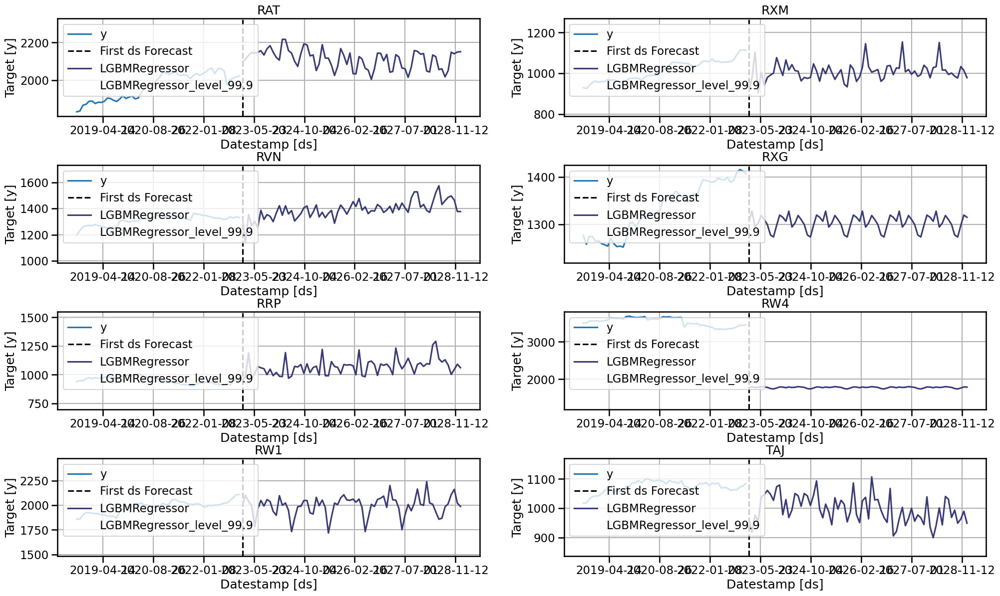

In [ ]:
#Plot prediction intervals

##lgbm

fit_snaive.plot(nurse_df, pred_lgbm)

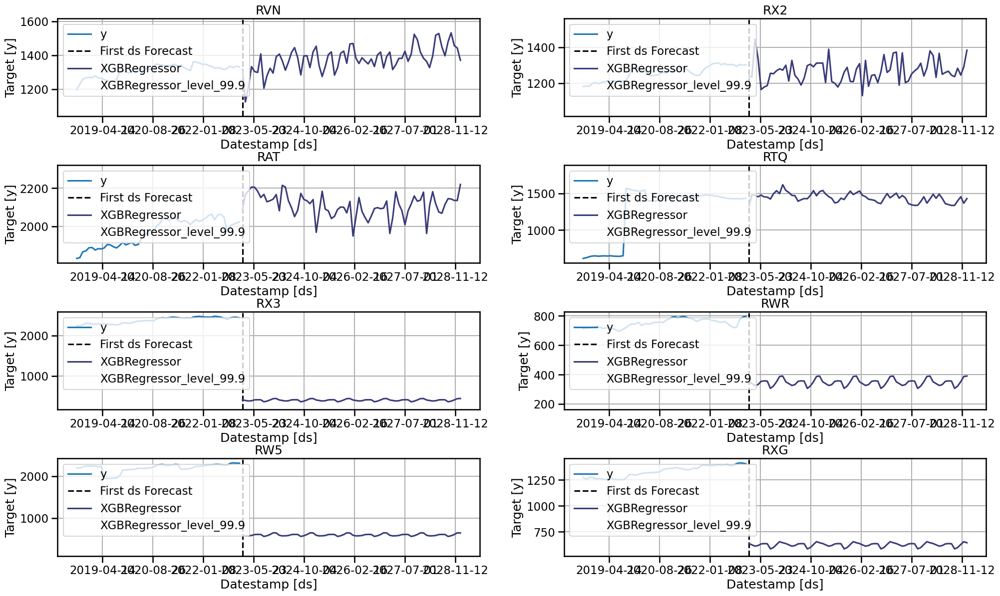

In [ ]:
##xgbm

fit_snaive.plot(nurse_df, pred_xgbm)

## Linear Regression

In [ ]:
## LM model

lm = MLForecast(
    models=[LinearRegression()],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 month
    #},
    date_features=['month', 'quarter', 'year'],

)

In [ ]:
## lm model

%%time

lm.fit(
    nurse_df_train,
    prediction_intervals=PredictionIntervals()
)

CPU times: user 165 ms, sys: 88.2 ms, total: 253 ms
Wall time: 223 ms


MLForecast(models=[LinearRegression], freq=<MonthEnd>, lag_features=[], date_features=['month', 'quarter', 'year'], num_threads=1)

In [ ]:
## forecastig for all prediction intervals

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

%time
pred_lm = lm.predict(72, dynamic_dfs=[nurse_df_future_variables], level=levels)

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 9.54 µs


/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:526: UserWarning: Prediction intervals are calculated using 1-step ahead cross-validation, with a constant width for all horizons. To vary the error by horizon, pass PredictionIntervals(h=h) to the `prediction_intervals` argument when refitting the model.
  warnings.warn(warn_msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcst_df[col] = quantiles[i]
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(a

In [ ]:
#Plot prediction intervals

##lm

fit_snaive.plot(nurse_df, pred_lm)

In [ ]:
## Save results

pred_lm.to_csv("pred_lm_eng.csv", index=False)
files.download("pred_lm_eng.csv")

pred_lgbm.to_csv("pred_lgbm_eng.csv", index=False)
files.download("pred_lgbm_eng.csv")

pred_xgbm.to_csv("pred_xgbm_eng.csv", index=False)
files.download("pred_xgbm_eng.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

High demand model

In [ ]:
## drop patient related normal and low scenarios

nurse_high = nurse_tidy.drop(["MHS32", "MHS01", "MHS07", "MHS29",
                              "MHS32_lag1", "MHS01_lag1", "MHS07_lag1", "MHS29_lag1",
                              "MHS32_low", "MHS01_low", "MHS07_low", "MHS29_low",
                              "MHS32_low_lag1", "MHS01_low_lag1", "MHS07_low_lag1", "MHS29_low_lag1",],axis = 1)
nurse_high


,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,international_joiners_mental_health,time_window,MHS32_high,MHS32_high_lag1,MHS01_high,MHS01_high_lag1,MHS07_high,MHS07_high_lag1,MHS29_high,MHS29_high_lag1
0,2018-07-31,2018,7,R1L,Y61,QH8,1483,19.000000,8.000000,0.000000,...,13,0,7720.000000,6985.000000,28535.000000,28145.000000,550.000000,555.000000,35670.000000,34880.000000
1,2018-07-31,2018,7,RAT,Y56,QMF,1832,18.000000,23.000000,0.000000,...,13,0,8540.000000,8640.000000,36085.000000,36180.000000,220.000000,230.000000,59050.000000,57740.000000
2,2018-07-31,2018,7,RDY,Y58,QVV,1698,17.000000,6.000000,0.000000,...,13,0,3780.000000,3895.000000,15460.000000,15440.000000,340.000000,340.000000,27705.000000,27695.000000
3,2018-07-31,2018,7,RGD,Y63,QWO,715,6.000000,9.000000,0.000000,...,13,0,2645.000000,2500.000000,15465.000000,15685.000000,355.000000,350.000000,29535.000000,27495.000000
4,2018-07-31,2018,7,RHA,Y60,QT1,2570,23.000000,11.000000,0.000000,...,13,0,6805.000000,6835.000000,22020.000000,21815.000000,860.000000,865.000000,35495.000000,35555.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5665,2028-12-31,2028,12,RXV,Y62,QOP,0,29.307739,43.611277,28.574231,...,44,125,14156.619378,15113.926476,39297.382380,37923.886706,1151.996371,1164.235568,120051.302007,130461.547552
5666,2028-12-31,2028,12,RXX,Y59,QXU,0,9.313750,10.168205,9.456801,...,44,125,7522.577352,9069.109244,34993.949557,34174.789603,129.005088,124.852368,28547.500624,32167.989256
5667,2028-12-31,2028,12,RXY,Y59,QKS,0,15.205238,13.136847,14.741527,...,44,125,10190.600222,11990.686959,21513.896607,21682.435503,411.637469,398.392990,51545.751942,63330.724101
5668,2028-12-31,2028,12,RYG,Y60,QWU,0,18.569753,22.707835,20.186316,...,44,125,5379.276187,6170.494542,10419.200610,10419.200610,129.859703,127.999042,23598.278508,27535.088735


In [ ]:
nurse_high['static_id'] = nurse_high['org_code']  # to use the id as a static feature as well

In [ ]:
# Category encoders's encoder replaces the categories
# with integers, in place, returning a dataframe with the original
# and encoded variables, by default.

# convert categorical features - for ML models

# Set up the ordinal encoder

o_enc = OrdinalEncoder()

o_enc.fit(nurse_high[['nhse_region_code', 'ics_code', 'static_id']])

nurse_high[['nhse_region_code', 'ics_code', 'static_id']] = o_enc.transform(nurse_high[['nhse_region_code', 'ics_code', 'static_id']])


In [ ]:
## train is the historic data, test is the future values of predictors

train = nurse_high[nurse_high['year'] <= 2022]

test = nurse_high[nurse_high['year'] > 2022]


In [ ]:
### Update top features list

key_features = ['date','hc', 'org_code', 'MHS32_high_lag1', 'MHS29_high_lag1', 'MHS29_high', 'MHS32_high', 'MHS01_high_lag1', 'MHS07_high_lag1', 'MHS01_high', 'MHS07_high']

old_features = ['MHS32_lag1', 'MHS29_lag1', 'MHS29', 'MHS32', 'MHS01_lag1', 'MHS07_lag1', 'MHS01', 'MHS07']

top_features_list = list(set(top_features_list) - set(old_features))

top_features_list.extend(key_features)

#top_features_list.remove('month')  ## we will add month using the ml model time features

In [ ]:
### Prepare Train dataset

nurse_df_train = train[top_features_list].copy()

nurse_df_train = nurse_df_train. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})

In [ ]:
### Prepare Future dataset

nurse_df_future = test[top_features_list].copy()

nurse_df_future = nurse_df_future. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})


In [ ]:
### scaling features

key_features = ['date', 'org_code', 'hc']

## remove org code, hc

top_features_list = list(set(top_features_list) - set(key_features))



In [ ]:
## scaling training values

ss = StandardScaler()

nurse_df_train[top_features_list] = ss.fit_transform(nurse_df_train[top_features_list])

In [ ]:
## scaling future values

nurse_df_future[top_features_list] = ss.fit_transform(nurse_df_future[top_features_list])

nurse_df_future_variables = nurse_df_future.drop(['y'], axis = 1)


In [ ]:
## lgb, xgb models

model_params = {
    'n_estimators': 1000,
    'max_depth': 4,
    'learning_rate': 0.1,
}

lgbm = MLForecast(
    models=[LGBMRegressor(**model_params)],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
    #},
    date_features=['month', 'year', 'quarter'],  # Date features to use as regressors

    num_threads=4,

)

xgbm = MLForecast(
    models=[XGBRegressor(**model_params),],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
    #},
    date_features=['month', 'year', 'quarter'],  # Date features to use as regressors

    num_threads=4,

)


In [ ]:
## lgbm model

%%time

lgbm.fit(
    nurse_df_train,
    static_features=['static_id', 'nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3033
[LightGBM] [Info] Number of data points in the train set: 2340, number of used features: 32
[LightGBM] [Info] Start training from score 1363.770085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

MLForecast(models=[LGBMRegressor], freq=<MonthEnd>, lag_features=[], date_features=['month', 'year', 'quarter'], num_threads=4)

In [ ]:
## xgbm model

%%time

xgbm.fit(
    nurse_df_train,
    static_features=['static_id', 'nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)


CPU times: user 22.5 s, sys: 98.7 ms, total: 22.6 s
Wall time: 13.9 s


MLForecast(models=[XGBRegressor], freq=<MonthEnd>, lag_features=[], date_features=['month', 'year', 'quarter'], num_threads=4)

In [ ]:
## forecastig for all prediction intervals

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

%time

pred_lgbm_high = lgbm.predict(72, dynamic_dfs=[nurse_df_future_variables], level=levels)

pred_xgbm_high = xgbm.predict(72, dynamic_dfs=[nurse_df_future_variables], level=levels)


CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 8.82 µs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcst_df[col] = quantiles[i]
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcst_df[col] = quantiles[i]
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor p

In [ ]:
#Plot prediction intervals

##lgbm

fit_snaive.plot(nurse_df, pred_lgbm_high)

In [ ]:
##xgbm

fit_snaive.plot(nurse_df, pred_xgbm_high)

In [ ]:
## LM model

lm = MLForecast(
    models=[LinearRegression()],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 month
    #},
    date_features=['month', 'quarter', 'year', 'week'],

)


In [ ]:
## lm model

%%time

lm.fit(
    nurse_df_train,
    prediction_intervals=PredictionIntervals()
)


CPU times: user 172 ms, sys: 50.8 ms, total: 223 ms
Wall time: 200 ms


MLForecast(models=[LinearRegression], freq=<MonthEnd>, lag_features=[], date_features=['month', 'quarter', 'year', 'week'], num_threads=1)

In [ ]:
## forecastig for all prediction intervals

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

%time
pred_lm_high = lm.predict(72, dynamic_dfs=[nurse_df_future_variables], level=levels)


CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 9.06 µs


/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:526: UserWarning: Prediction intervals are calculated using 1-step ahead cross-validation, with a constant width for all horizons. To vary the error by horizon, pass PredictionIntervals(h=h) to the `prediction_intervals` argument when refitting the model.
  warnings.warn(warn_msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcst_df[col] = quantiles[i]
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(a

In [ ]:
#Plot prediction intervals

##lm

fit_snaive.plot(nurse_df, pred_lm_high)


In [ ]:
## Save results

pred_lm_high.to_csv("pred_lm_high_eng.csv", index=False)
files.download("pred_lm_high_eng.csv")

pred_lgbm_high.to_csv("pred_lgbm_high_eng.csv", index=False)
files.download("pred_lgbm_high_eng.csv")

pred_xgbm_high.to_csv("pred_xgbm_high_eng.csv", index=False)
files.download("pred_xgbm_high_eng.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Low demand model

In [ ]:
## drop patient related normal and high scenarios

nurse_low = nurse_tidy.drop(["MHS32", "MHS01", "MHS07", "MHS29",
                              "MHS32_lag1", "MHS01_lag1", "MHS07_lag1", "MHS29_lag1",
                              "MHS32_high", "MHS01_high", "MHS07_high", "MHS29_high",
                              "MHS32_high_lag1", "MHS01_high_lag1", "MHS07_high_lag1", "MHS29_high_lag1",],axis = 1)
nurse_low

,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,international_joiners_mental_health,time_window,MHS32_low,MHS32_low_lag1,MHS01_low,MHS01_low_lag1,MHS07_low,MHS07_low_lag1,MHS29_low,MHS29_low_lag1
0,2018-07-31,2018,7,R1L,Y61,QH8,1483,19.000000,8.000000,0.000000,...,13,0,7720.000000,6985.000000,28535.000000,28145.000000,550.000000,555.000000,35670.000000,34880.000000
1,2018-07-31,2018,7,RAT,Y56,QMF,1832,18.000000,23.000000,0.000000,...,13,0,8540.000000,8640.000000,36085.000000,36180.000000,220.000000,230.000000,59050.000000,57740.000000
2,2018-07-31,2018,7,RDY,Y58,QVV,1698,17.000000,6.000000,0.000000,...,13,0,3780.000000,3895.000000,15460.000000,15440.000000,340.000000,340.000000,27705.000000,27695.000000
3,2018-07-31,2018,7,RGD,Y63,QWO,715,6.000000,9.000000,0.000000,...,13,0,2645.000000,2500.000000,15465.000000,15685.000000,355.000000,350.000000,29535.000000,27495.000000
4,2018-07-31,2018,7,RHA,Y60,QT1,2570,23.000000,11.000000,0.000000,...,13,0,6805.000000,6835.000000,22020.000000,21815.000000,860.000000,865.000000,35495.000000,35555.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5665,2028-12-31,2028,12,RXV,Y62,QOP,0,29.307739,43.611277,28.574231,...,44,125,11957.795368,12915.102466,33494.886489,32121.390814,1087.330566,1099.569764,110119.792175,120530.037720
5666,2028-12-31,2028,12,RXX,Y59,QXU,0,9.313750,10.168205,9.456801,...,44,125,4930.373259,6476.905152,30116.566616,29297.406662,114.794208,110.641488,17582.998727,21203.487358
5667,2028-12-31,2028,12,RXY,Y59,QKS,0,15.205238,13.136847,14.741527,...,44,125,8699.410365,10499.497102,20196.399716,20364.938612,371.318519,358.074039,45978.841931,57763.814089
5668,2028-12-31,2028,12,RYG,Y60,QWU,0,18.569753,22.707835,20.186316,...,44,125,3540.431036,4331.649391,-5911.030861,-5911.030861,-1.379077,-3.239738,18528.752604,22465.562830


In [ ]:
nurse_low['static_id'] = nurse_low['org_code']  # to use the id as a static feature as well

In [ ]:
# Category encoders's encoder replaces the categories
# with integers, in place, returning a dataframe with the original
# and encoded variables, by default.

# convert categorical features - for ML models

# Set up the ordinal encoder

o_enc = OrdinalEncoder()

o_enc.fit(nurse_low[['nhse_region_code', 'ics_code', 'static_id']])

nurse_low[['nhse_region_code', 'ics_code', 'static_id']] = o_enc.transform(nurse_low[['nhse_region_code', 'ics_code', 'static_id']])


In [ ]:
## train is the historic data, test is the future values of predictors

train = nurse_low[nurse_low['year'] <= 2022]

test = nurse_low[nurse_low['year'] > 2022]


In [ ]:
## Update top features list

key_features = ['date','hc', 'org_code', 'MHS32_low_lag1', 'MHS29_low_lag1', 'MHS29_low', 'MHS32_low', 'MHS01_low_lag1', 'MHS07_low_lag1', 'MHS01_low', 'MHS07_low']

old_features = ['MHS32_high_lag1', 'MHS29_high_lag1', 'MHS29_high', 'MHS32_high', 'MHS01_high_lag1', 'MHS07_high_lag1', 'MHS01_high', 'MHS07_high']

top_features_list = list(set(top_features_list) - set(old_features))

top_features_list.extend(key_features)

#top_features_list.remove('month')  ## we will add month using the ml model time features

In [ ]:
### Prepare Train dataset

nurse_df_train = train[top_features_list].copy()

nurse_df_train = nurse_df_train. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})


In [ ]:
### Prepare Future dataset

nurse_df_future = test[top_features_list].copy()

nurse_df_future = nurse_df_future. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})


In [ ]:
### scaling features

key_features = ['date', 'org_code', 'hc']

## remove org code, hc

top_features_list = list(set(top_features_list) - set(key_features))


In [ ]:
## scaling training values

ss = StandardScaler()

nurse_df_train[top_features_list] = ss.fit_transform(nurse_df_train[top_features_list])


In [ ]:
## scaling future values

nurse_df_future[top_features_list] = ss.fit_transform(nurse_df_future[top_features_list])

nurse_df_future_variables = nurse_df_future.drop(['y'], axis = 1)


In [ ]:
## lgb, xgb models

model_params = {
    'n_estimators': 1000,
    'max_depth': 4,
    'learning_rate': 0.1,
}

lgbm = MLForecast(
    models=[LGBMRegressor(**model_params)],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
    #},
    date_features=['month'],  # Date features to use as regressors

    num_threads=4,

)

xgbm = MLForecast(
    models=[XGBRegressor(**model_params),],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
    #},
    date_features=['month'],  # Date features to use as regressors

    num_threads=4,

)


In [ ]:
## lgbm model

%%time

lgbm.fit(
    nurse_df_train,
    static_features=['static_id', 'nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3022
[LightGBM] [Info] Number of data points in the train set: 2340, number of used features: 30
[LightGBM] [Info] Start training from score 1363.770085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

MLForecast(models=[LGBMRegressor], freq=<MonthEnd>, lag_features=[], date_features=['month'], num_threads=4)

In [ ]:
## xgbm model

%%time

xgbm.fit(
    nurse_df_train,
    static_features=['static_id', 'nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)


CPU times: user 21.9 s, sys: 88.3 ms, total: 22 s
Wall time: 13.7 s


MLForecast(models=[XGBRegressor], freq=<MonthEnd>, lag_features=[], date_features=['month'], num_threads=4)

In [ ]:
## forecastig for all prediction intervals

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

%time

pred_lgbm_low = lgbm.predict(72, dynamic_dfs=[nurse_df_future_variables], level=levels)

pred_xgbm_low = xgbm.predict(72, dynamic_dfs=[nurse_df_future_variables], level=levels)


CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 8.58 µs


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcst_df[col] = quantiles[i]
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcst_df[col] = quantiles[i]
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor p

In [ ]:
#Plot prediction intervals

##lgbm

fit_snaive.plot(nurse_df, pred_lgbm_low)


In [ ]:
##xgbm

fit_snaive.plot(nurse_df, pred_xgbm_low)

In [ ]:
## LM model

lm = MLForecast(
    models=[LinearRegression()],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 month
    #},
    date_features=['month', 'year', 'quarter'],

)


In [ ]:
## lm model

%%time

lm.fit(
    nurse_df_train,
    prediction_intervals=PredictionIntervals()
)


CPU times: user 148 ms, sys: 92 ms, total: 240 ms
Wall time: 138 ms


MLForecast(models=[LinearRegression], freq=<MonthEnd>, lag_features=[], date_features=['month', 'year', 'quarter'], num_threads=1)

In [ ]:
## forecastig for all prediction intervals

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

%time
pred_lm_low = lm.predict(72, dynamic_dfs=[nurse_df_future_variables], level=levels)


CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.15 µs


/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:526: UserWarning: Prediction intervals are calculated using 1-step ahead cross-validation, with a constant width for all horizons. To vary the error by horizon, pass PredictionIntervals(h=h) to the `prediction_intervals` argument when refitting the model.
  warnings.warn(warn_msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcst_df[col] = quantiles[i]
/usr/local/lib/python3.10/dist-packages/mlforecast/forecast.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(a

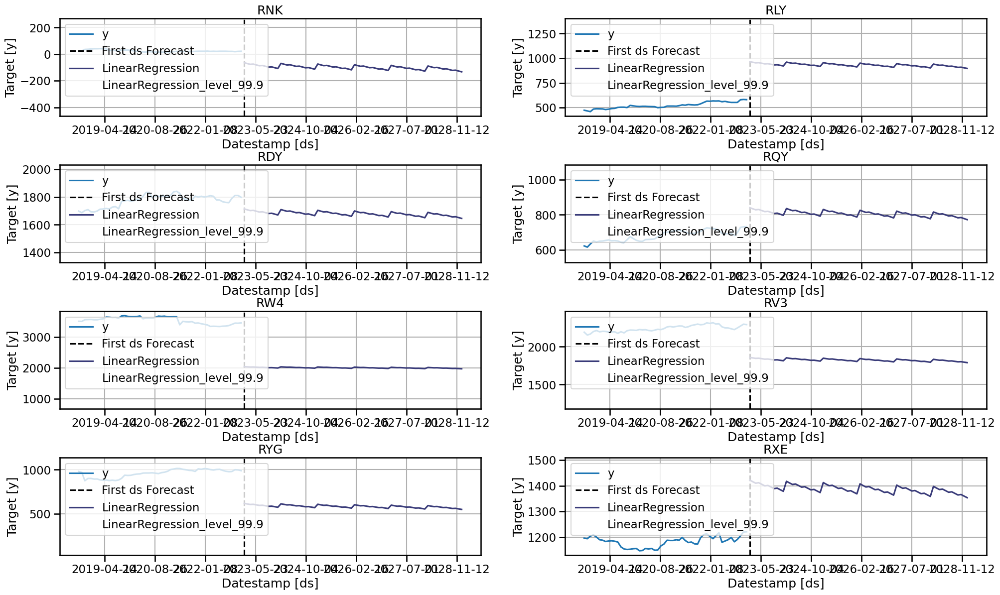

In [ ]:
#Plot prediction intervals

##lm

fit_snaive.plot(nurse_df, pred_lm_low)


In [ ]:
## Save results

pred_lm_low.to_csv("pred_lm_low_eng.csv", index=False)
files.download("pred_lm_low_eng.csv")

pred_lgbm_low.to_csv("pred_lgbm_low_eng.csv", index=False)
files.download("pred_lgbm_low_eng.csv")

pred_xgbm_low.to_csv("pred_xgbm_low_eng.csv", index=False)
files.download("pred_xgbm_low_eng.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>